<a href="https://colab.research.google.com/github/tariqshaban/disaster-classification-with-xai/blob/master/CNN%20Disaster%20Dataset%20with%20Explainable%20AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Dependencies

In [1]:
!pip install tensorflow_hub
!pip install tensorflow_datasets
!pip install lime
!pip install colorama
!pip install opencv-python
!git clone https://github.com/samson6460/tf_keras_gradcamplusplus.git ./assets/tf_keras_gradcamplusplus

import os
import sys
import re
import random
import shutil
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
import skimage

from colorama import Fore, Style
from PIL import Image, ImageFile
from keras.callbacks import EarlyStopping
from keras.layers import Dense, Dropout, GlobalAveragePooling2D, Identity, InputLayer, Rescaling
from keras.models import Sequential
from lime import lime_image
from skimage.segmentation import mark_boundaries
from sklearn.metrics import confusion_matrix
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.applications.efficientnet import EfficientNetB7
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2B0
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2L
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from glob import glob
from assets.tf_keras_gradcamplusplus.utils import preprocess_image
from assets.tf_keras_gradcamplusplus.gradcam import grad_cam, grad_cam_plus
from IPython.display import clear_output
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog

clear_output()
print(Fore.GREEN + u'\u2713 ' + 'Successfully downloaded dependencies.')
print(Style.RESET_ALL)

✓ Successfully downloaded dependencies.



In [2]:
class IgnorePrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

# Global Variables

In [3]:
DATASETS = ['disaster_images', 'medic']

DATASET = 'disaster_images'
# DATASET = 'medic'

CLASSES = []

SEED = 68765

TRAIN_SPLIT = 0.7
VALID_SPLIT = 0.2
TEST_SPLIT = 0.1

IMAGE_SHAPE_2D = (224, 224)
IMAGE_SHAPE_3D = (224, 224, 3)

SOURCE_DIRECTORY = './assets/disaster_data/'
REFACTORED_DIRECTORY = './assets/refactored_data/'
TRAIN_DIRECTORY = './assets/refactored_data/train/'
VALID_DIRECTORY = './assets/refactored_data/valid/'
TEST_DIRECTORY = './assets/refactored_data/test/'

EPOCHS = 1000
PATIENCE = 20
BATCH_SIZE = 128

# LEARNING_RATE = 0.01
# LEARNING_RATE = 0.001
LEARNING_RATE = 0.0001

# BASE_MODEL = BaggingClassifier(random_state=SEED)

# BASE_MODEL = DecisionTreeClassifier(random_state=SEED)

# BASE_MODEL = RandomForestClassifier(random_state=SEED)

# BASE_MODEL = KNeighborsClassifier()

# BASE_MODEL = SVC(random_state=SEED)

# BASE_MODEL = SGDClassifier(loss='hinge', max_iter=1000, tol=1e-3, random_state=SEED)

# BASE_MODEL = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3, random_state=SEED)

BASE_MODEL = ResNet50(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.resnet50.preprocess_input

# BASE_MODEL = InceptionV3(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
# PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.inception_v3.preprocess_input

# BASE_MODEL = VGG19(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
# PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.vgg19.preprocess_input

# BASE_MODEL = EfficientNetB0(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
# PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.efficientnet.preprocess_input

# BASE_MODEL = EfficientNetB7(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
# PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.efficientnet.preprocess_input

# BASE_MODEL = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
# PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.efficientnet_v2.preprocess_input

# BASE_MODEL = EfficientNetV2L(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE_3D)
# PREPROCESSING_METHOD = preprocessing_function=tf.keras.applications.efficientnet_v2.preprocess_input

# BASE_MODEL = hub.KerasLayer('https://tfhub.dev/sayakpaul/vit_b32_fe/1')
# PREPROCESSING_METHOD = None

# OPTIMIZER = tf.keras.optimizers.RMSprop(learning_rate=LEARNING_RATE)
OPTIMIZER = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

2024-04-09 13:35:32.237509: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22253 MB memory:  -> device: 0, name: Tesla P40, pci bus id: 0000:37:00.0, compute capability: 6.1
2024-04-09 13:35:32.238144: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22253 MB memory:  -> device: 1, name: Tesla P40, pci bus id: 0000:86:00.0, compute capability: 6.1


# Helper Methods

#### Load Dataset

In [4]:
def load_dataset():
  global CLASSES
  assert DATASET in DATASETS, f'Input string \'{DATASET}\' must be one of following: {DATASETS}.'


  def _load_disaster_images_dataset():
    !git clone https://github.com/tariqshaban/disaster-classification-with-xai.git
    !mv -v ./disaster-classification-with-xai/assets/* ./assets
    !rm -rf disaster-classification-with-xai

  def _load_medic_dataset():
    !wget https://crisisnlp.qcri.org/data/medic/MEDIC.tar.gz
    !mkdir ./Medic
    !tar -xzvf ./MEDIC.tar.gz -C ./Medic

    !mkdir -p ./assets/disaster_data/_raw
    !mkdir ./assets/disaster_data/_metadata/
    !mv ./Medic/data/* ./assets/disaster_data/_raw
    !mv ./Medic/MEDIC_train.tsv ./assets/disaster_data/_metadata/
    !mv ./Medic/MEDIC_dev.tsv ./assets/disaster_data/_metadata/
    !mv ./Medic/MEDIC_test.tsv ./assets/disaster_data/_metadata/
    !rm -rf ./Medic

    tsv_files = !find ./assets/disaster_data/_metadata -name '*.tsv'

    dfs = []
    for file in tsv_files:
        dfs.append(pd.read_csv(file, sep='\t'))
    df = pd.concat(dfs, ignore_index=True)
    df = df[df['informative'] == 'informative']
    df = df[['disaster_types', 'image_path']]
    df['image_path'] = df['image_path'].str.split('/', n=1, expand=True)[1]

    for index, row in df.iterrows():
        image_path = row['image_path']
        class_name = row['disaster_types']
        destination_folder = f'./assets/disaster_data/{class_name}'
        if not os.path.exists(destination_folder):
            os.makedirs(destination_folder)
        print(f'./assets/disaster_data/_raw/{image_path}')
        print(f'{destination_folder}/{os.path.basename(image_path)}')
        shutil.move(f'./assets/disaster_data/_raw/{image_path}', f'{destination_folder}/{os.path.basename(image_path)}')

    !rm -rf ./assets/disaster_data/_raw
    !rm -rf ./assets/disaster_data/_metadata

  if DATASET == 'disaster_images':
    _load_disaster_images_dataset()
  elif DATASET == 'medic':
    _load_medic_dataset()

  CLASSES = os.listdir('./assets/disaster_data')

#### Prime Dataset

In [5]:
def prime_dataset():
  if os.path.exists(REFACTORED_DIRECTORY):
    shutil.rmtree(REFACTORED_DIRECTORY)

  # Read Each Image With its Class Label
  images = []
  folders=CLASSES

  for folder in folders:
    t = folder
    x = !ls $SOURCE_DIRECTORY$t
    for i in x:
      for j in re.split(r'[-;,\t\s]\s*', i):
        if j == '':
          continue
        images.append({'Class':t,'Image':j})


  # Partition Images into Training, Validation, and Testing
  for c in folders:
      os.makedirs(f'{TRAIN_DIRECTORY}{c}', exist_ok=True)
      os.makedirs(f'{VALID_DIRECTORY}{c}', exist_ok=True)
      os.makedirs(f'{TEST_DIRECTORY}{c}', exist_ok=True)

  counter=0
  for c in folders:
      numOfFiles = len(next(os.walk(f'{SOURCE_DIRECTORY}{c}/'))[2])
      for files in random.sample(glob(f'{SOURCE_DIRECTORY}{c}/*'), int(numOfFiles*TRAIN_SPLIT)):
          shutil.move(files, f'{TRAIN_DIRECTORY}{c}')

      for files in random.sample(glob(f'{SOURCE_DIRECTORY}{c}/*'), int(numOfFiles*VALID_SPLIT)):
          shutil.move(files, f'{VALID_DIRECTORY}{c}')

      for files in glob(f'{SOURCE_DIRECTORY}{c}/*'):
          shutil.move(files, f'{TEST_DIRECTORY}{c}')
      counter+=1

  shutil.rmtree(SOURCE_DIRECTORY)

#### Build Model

In [6]:
class RGB2GrayTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
 
    def fit(self, X, y=None):
        return self
 
    def transform(self, X, y=None):
        return np.array([skimage.color.rgb2gray(img) for img in X])
     
 
class HogTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, y=None, orientations=9,
                 pixels_per_cell=(8, 8),
                 cells_per_block=(3, 3), block_norm='L2-Hys'):
        self.y = y
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm
 
    def fit(self, X, y=None):
        return self
 
    def transform(self, X, y=None):
 
        def local_hog(X):
            return hog(X,
                       orientations=self.orientations,
                       pixels_per_cell=self.pixels_per_cell,
                       cells_per_block=self.cells_per_block,
                       block_norm=self.block_norm)
 
        try:
            return np.array([local_hog(img) for img in X])
        except:
            return np.array([local_hog(img) for img in X])

In [7]:
def build_classical_model(measure_performance:bool = True):
  ImageFile.LOAD_TRUNCATED_IMAGES = True

  data_train = {
    'pixels': [],
    'labels': [],
  }

  data_test = {
    'pixels': [],
    'labels': [],
  }

  for class_name in os.listdir(TRAIN_DIRECTORY):
    class_path = os.path.join(TRAIN_DIRECTORY, class_name)
    for image_file in os.listdir(class_path):
      image_path = os.path.join(class_path, image_file)
      img = cv2.imread(image_path)
      img = cv2.resize(img, IMAGE_SHAPE_2D)
      data_train['pixels'].append(img)
      data_train['labels'].append(class_name)

  for class_name in os.listdir(VALID_DIRECTORY):
    class_path = os.path.join(VALID_DIRECTORY, class_name)
    for image_file in os.listdir(class_path):
      image_path = os.path.join(class_path, image_file)
      img = cv2.imread(image_path)
      img = cv2.resize(img, IMAGE_SHAPE_2D)
      data_train['pixels'].append(img)
      data_train['labels'].append(class_name)

  for class_name in os.listdir(TEST_DIRECTORY):
    class_path = os.path.join(TEST_DIRECTORY, class_name)
    for image_file in os.listdir(class_path):
      image_path = os.path.join(class_path, image_file)
      img = cv2.imread(image_path)
      img = cv2.resize(img, IMAGE_SHAPE_2D)
      data_test['pixels'].append(img)
      data_test['labels'].append(class_name)

  grouped_data_train = list(zip(data_train['pixels'], data_train['labels']))
  random.shuffle(grouped_data_train)
  data_train['pixels'], data_train['labels'] = zip(*grouped_data_train)

  gray_transformer = RGB2GrayTransformer()
  hog_transformer = HogTransformer(
      pixels_per_cell=(14, 14), 
      cells_per_block=(2,2), 
      orientations=9, 
      block_norm='L2-Hys'
  )
  scalar = StandardScaler()
 
  data_train['pixels'] = gray_transformer.fit_transform(data_train['pixels'])
  data_train['pixels'] = hog_transformer.fit_transform(data_train['pixels'])
  data_train['pixels'] = scalar.fit_transform(data_train['pixels'])

  data_test['pixels'] = gray_transformer.fit_transform(data_test['pixels'])
  data_test['pixels'] = hog_transformer.fit_transform(data_test['pixels'])
  data_test['pixels'] = scalar.fit_transform(data_test['pixels'])
 
  BASE_MODEL.fit(data_train['pixels'], data_train['labels'])

  y_pred = BASE_MODEL.predict(data_test['pixels'])

  accuracy = np.sum(y_pred == data_test['labels']) / len(data_test['labels'])

  print('\n')
  print(Fore.GREEN + u'\n\u2713 ' + f'Accuracy ==> {accuracy}')

  plt.rcParams["figure.figsize"] = (15,8)

  if measure_performance:
    ax = sns.heatmap(confusion_matrix(data_test['labels'], y_pred, labels=CLASSES), annot=True, cmap='Blues', fmt='g')
    ax.set_title('Confusion Matrix')
    ax.set_xlabel('Predicted Values')
    ax.set_ylabel('Actual Values')
    ax.xaxis.set_ticklabels(CLASSES)
    ax.yaxis.set_ticklabels(CLASSES)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.show()

In [8]:
def build_model(measure_performance:bool = True):
  ImageFile.LOAD_TRUNCATED_IMAGES = True

  train_batches = ImageDataGenerator(preprocessing_function=PREPROCESSING_METHOD).flow_from_directory(directory=TRAIN_DIRECTORY, target_size=IMAGE_SHAPE_2D, classes=CLASSES, batch_size=BATCH_SIZE)
  valid_batches = ImageDataGenerator(preprocessing_function=PREPROCESSING_METHOD).flow_from_directory(directory=VALID_DIRECTORY, target_size=IMAGE_SHAPE_2D, classes=CLASSES, batch_size=BATCH_SIZE, shuffle=False)
  test_batches =  ImageDataGenerator(preprocessing_function=PREPROCESSING_METHOD).flow_from_directory(directory=TEST_DIRECTORY, target_size=IMAGE_SHAPE_2D, classes=CLASSES, batch_size=BATCH_SIZE, shuffle=False)

  input_shape = IMAGE_SHAPE_3D
  nclass = len(CLASSES)
  epoch = EPOCHS
  base_model = BASE_MODEL
  base_model.trainable = False

  model = Sequential()
  if len(BASE_MODEL(tf.zeros((1, *IMAGE_SHAPE_3D))).shape) == 4:
      model.add(base_model)
      model.add(Identity())
      model.add(GlobalAveragePooling2D())
      model.add(Dropout(0.2))
      model.add(Dense(256, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(128, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(64, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(32, activation='relu'))
      model.add(Dense(nclass, activation='softmax'))
  else:
      model.add(InputLayer(input_shape))
      model.add(Rescaling(scale=1/127.5, offset=-1))
      model.add(base_model)
      model.add(Dense(512, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(256, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(128, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(64, activation='relu'))
      model.add(Dropout(0.2))
      model.add(Dense(nclass, activation='softmax'))

  model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=LEARNING_RATE), loss='categorical_crossentropy', metrics=['accuracy'])
  es = EarlyStopping(monitor='val_loss', mode='auto', verbose=1 ,  patience = PATIENCE)

  model.summary()

  fitted_model= model.fit(x=train_batches, validation_data=valid_batches, epochs=epoch, callbacks=[es])
  score, accuracy = model.evaluate(x=test_batches, batch_size=BATCH_SIZE)

  print('\n')
  print(Fore.GREEN + u'\n\u2713 ' + f'Loss ==> {score}')
  print(Fore.GREEN + u'\n\u2713 ' + f'Accuracy ==> {accuracy}')

  plt.rcParams["figure.figsize"] = (15,8)

  if measure_performance:
    plt.plot(fitted_model.history['accuracy'])
    plt.plot(fitted_model.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Valid'], loc='upper left')
    plt.show()

    plt.plot(fitted_model.history['loss'])
    plt.plot(fitted_model.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Valid'], loc='upper left')
    plt.show()

    y_pred = model.predict(test_batches)

    ax = sns.heatmap(confusion_matrix(test_batches.classes, y_pred.argmax(axis=1)), annot=True, cmap='Blues', fmt='g')
    ax.set_title('Confusion Matrix')
    ax.set_xlabel('Predicted Values')
    ax.set_ylabel('Actual Values')
    ax.xaxis.set_ticklabels(CLASSES)
    ax.yaxis.set_ticklabels(CLASSES)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.show()

  return model

#### Predict Image Class

In [9]:
def predict_image_class(img, model):
  img = np.expand_dims(img, axis=0)
  preprocessed_image = image_preprocess(img)
  tensor = tf.convert_to_tensor(preprocessed_image, dtype=tf.float32)

  print(Fore.GREEN + u'\n\u2713 ' + f'Model Output ==> {CLASSES[np.argmax(model.predict(tensor))]}')    
  print(Style.RESET_ALL)

#### Show Image

In [10]:
def show_image(img):
  img = Image.fromarray(img)  
  display(img)

#### URL to Image

In [11]:
def url_to_image(url):
  image_url = tf.keras.utils.get_file(origin=url)
  img = image.load_img(image_url, target_size=IMAGE_SHAPE_2D)
  img = np.expand_dims(img, axis=0)
  return np.vstack([img])[0]

#### Get Image

In [12]:
def path_to_image(image_name = None):
  for root, dirs, files in os.walk(REFACTORED_DIRECTORY):
          if image_name in files:
              image_name = os.path.join(root, image_name)
              break

  img = Image.open(image_name)
  img = img.resize(IMAGE_SHAPE_2D)    
  img = np.expand_dims(img, axis=0)
  return np.vstack([img])[0]

#### Implement image preprocessing method

In [13]:
def image_preprocess(img):
  return PREPROCESSING_METHOD(img)

#### Implement Lime XAI

In [14]:
def explain_image_lime(img, model):
  # Temporarily disable output stream, preventing unnecesarry output
  with IgnorePrints():
      preprocessedImage = image_preprocess(img)

      explainer = lime_image.LimeImageExplainer()
      explanation = explainer.explain_instance(np.asanyarray(preprocessedImage).astype('double'), model.predict, top_labels=5, hide_color=0, num_samples=1000)

      temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
        
  return mark_boundaries(img, mask)
 

#### Implemnt Grad-CAM XAI

In [15]:
def show_imgwithheat(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = (heatmap*255).astype("uint8")
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    return superimposed_img

In [16]:
def explain_image_grad_cam(img, model):
  assert len(model.layers[1].get_output_at(0).get_shape().as_list()) == 4, \
    f'Expected the number of dimensions in the layer to be 4, ' \
    f'found {len(model.layers[1].get_output_at(0).get_shape().as_list())}.'    

  image_path = './assets/buffer.jpg'  

  Image.fromarray(img).save(image_path)
    
  img = preprocess_image(image_path, target_size=IMAGE_SHAPE_2D)
  preprocessed_image = image_preprocess(img)
    
  heatmap = grad_cam(
    model, preprocessed_image,
    layer_name = model.layers[1].name,
  )
    
  img_arr = show_imgwithheat(image_path, heatmap)

  os.remove(image_path)
    
  return img_arr

#### Implemnt Grad-CAM++ XAI

In [17]:
def explain_image_grad_cam_plus_plus(img, model):
  assert len(model.layers[1].get_output_at(0).get_shape().as_list()) == 4, \
    f'Expected the number of dimensions in the layer to be 4, ' \
    f'found {len(model.layers[1].get_output_at(0).get_shape().as_list())}.'    

  image_path = './assets/buffer.jpg'   

  Image.fromarray(img).save(image_path)
    
  img = preprocess_image(image_path, target_size=IMAGE_SHAPE_2D)
  preprocessed_image = image_preprocess(img)

  heatmap = grad_cam_plus(
    model, preprocessed_image,
    layer_name = model.layers[1].name,
  )
    
  show_imgwithheat(image_path, heatmap)

  img_arr = show_imgwithheat(image_path, heatmap)

  os.remove(image_path)
    
  return img_arr

#### Plot XAI

In [18]:
def plot_XAI(img, model):
  plt.rcParams["figure.figsize"] = (10,10)
  fig, ax = plt.subplots(2,2)
  ax[0,0].imshow(img)
  ax[0,1].imshow(explain_image_lime(img, model))
  ax[1,0].imshow(explain_image_grad_cam(img, model))
  ax[1,1].imshow(explain_image_grad_cam_plus_plus(img, model))

  ax[0, 0].set_title("Original Image")
  ax[0, 1].set_title("LIME")
  ax[1, 0].set_title("Grad-CAM")
  ax[1, 1].set_title("Grad-CAM++")

  fig.tight_layout()
  plt.show()
  plt.rcParams["figure.figsize"] = (15,8)

# Methods Invocation

In [19]:
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [20]:
load_dataset()

Cloning into 'disaster-classification-with-xai'...
remote: Enumerating objects: 13523, done.
remote: Counting objects: 100% (3542/3542), done.
remote: Compressing objects: 100% (3507/3507), done.
remote: Total 13523 (delta 38), reused 3538 (delta 35), pack-reused 9981
Receiving objects: 100% (13523/13523), 658.57 MiB | 10.98 MiB/s, done.
Resolving deltas: 100% (41/41), done.
Updating files: 100% (13570/13570), done.
renamed './disaster-classification-with-xai/assets/disaster_data' -> './assets/disaster_data'
mv: cannot move './disaster-classification-with-xai/assets/images' to './assets/images': Directory not empty


In [21]:
prime_dataset()

Found 9484 images belonging to 12 classes.
Found 2707 images belonging to 12 classes.
Found 1365 images belonging to 12 classes.


2024-04-09 13:36:45.452366: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 identity (Identity)         (None, 7, 7, 2048)        0         
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                        

2024-04-09 13:36:58.451537: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fdfe4d80180 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-09 13:36:58.451583: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): Tesla P40, Compute Capability 6.1
2024-04-09 13:36:58.451592: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (1): Tesla P40, Compute Capability 6.1
2024-04-09 13:36:58.458563: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1712659018.543979 1132994 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


75/75 [==============================] - 74s 848ms/step - loss: 1.6250 - accuracy: 0.4812 - val_loss: 0.9202 - val_accuracy: 0.7540
Epoch 2/1000
75/75 [==============================] - 61s 814ms/step - loss: 0.9481 - accuracy: 0.7125 - val_loss: 0.5553 - val_accuracy: 0.8400
Epoch 3/1000
75/75 [==============================] - 61s 815ms/step - loss: 0.6596 - accuracy: 0.8068 - val_loss: 0.4427 - val_accuracy: 0.8648
Epoch 4/1000
75/75 [==============================] - 61s 817ms/step - loss: 0.5684 - accuracy: 0.8315 - val_loss: 0.3845 - val_accuracy: 0.8840
Epoch 5/1000
75/75 [==============================] - 61s 810ms/step - loss: 0.4870 - accuracy: 0.8526 - val_loss: 0.3386 - val_accuracy: 0.8995
Epoch 6/1000
75/75 [==============================] - 62s 820ms/step - loss: 0.4303 - accuracy: 0.8691 - val_loss: 0.3082 - val_accuracy: 0.9054
Epoch 7/1000
75/75 [==============================] - 61s 818ms/step - loss: 0.3950 - accuracy: 0.8801 - val_loss: 0.2847 - val_accuracy: 0.918

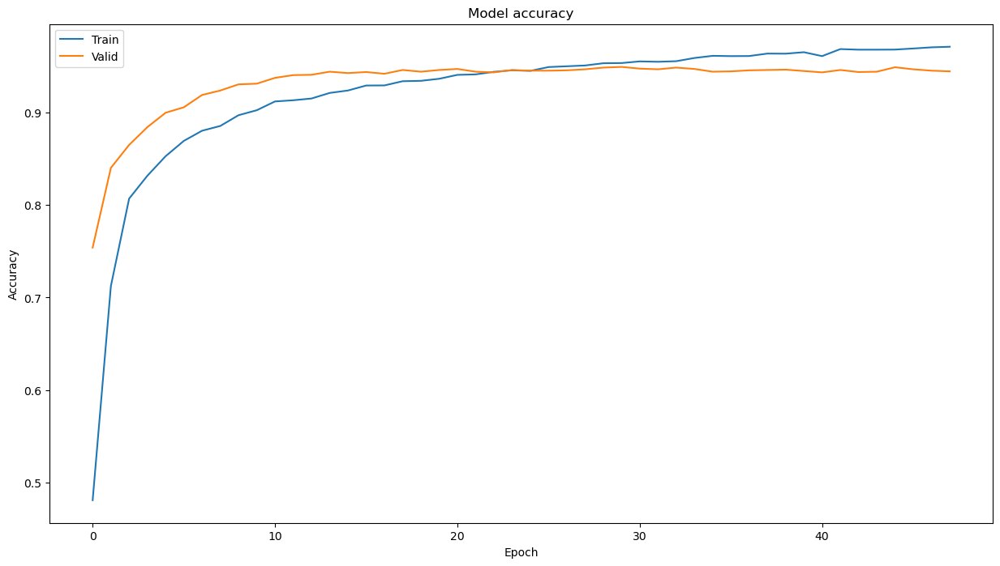

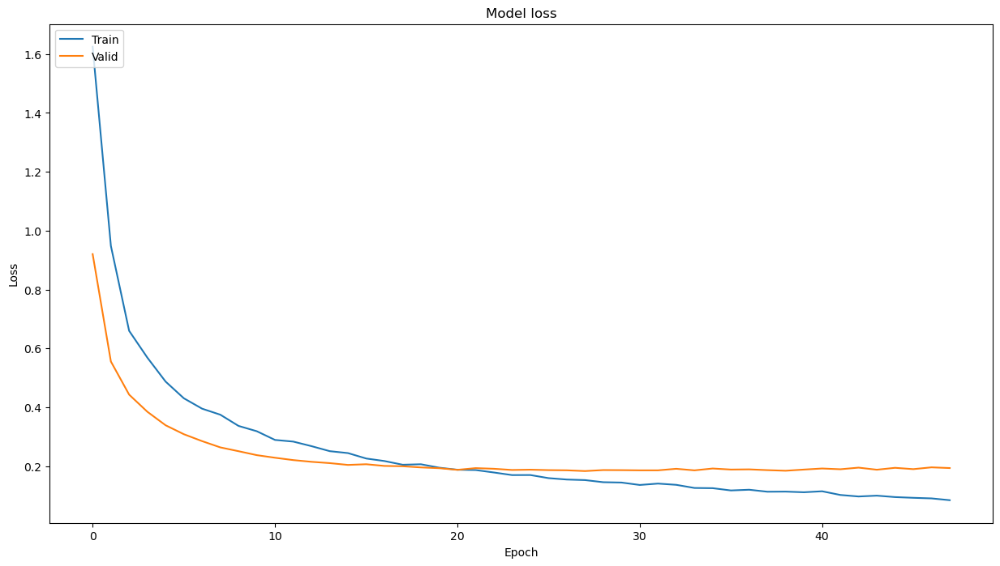

11/11 [==============================] - 8s 571ms/step


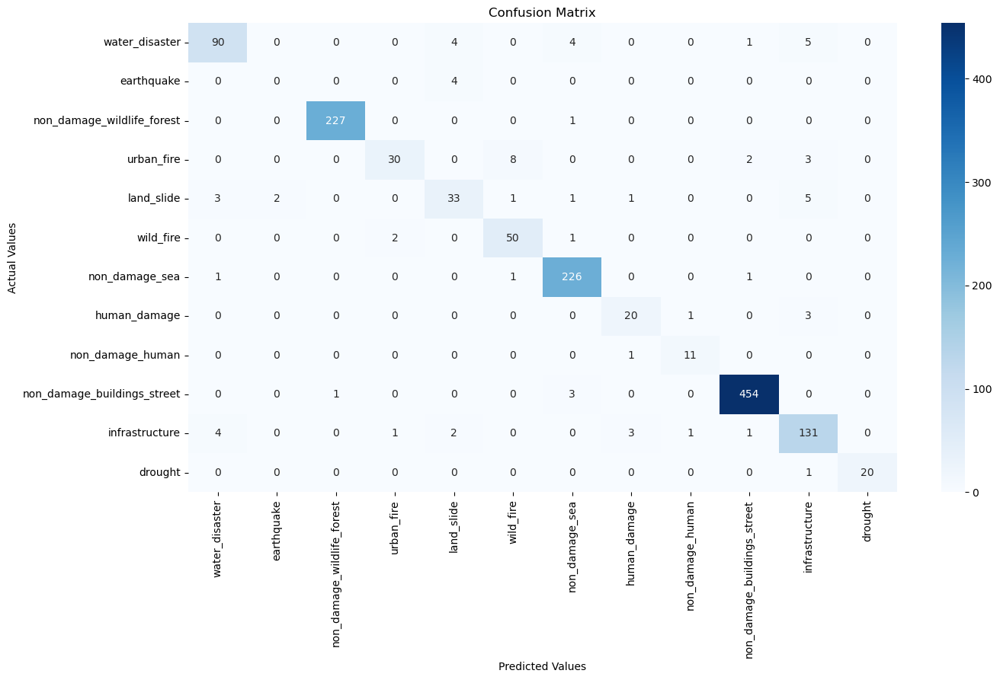

In [22]:
model = build_model(measure_performance=True)

  0%|          | 0/1000 [00:00<?, ?it/s]

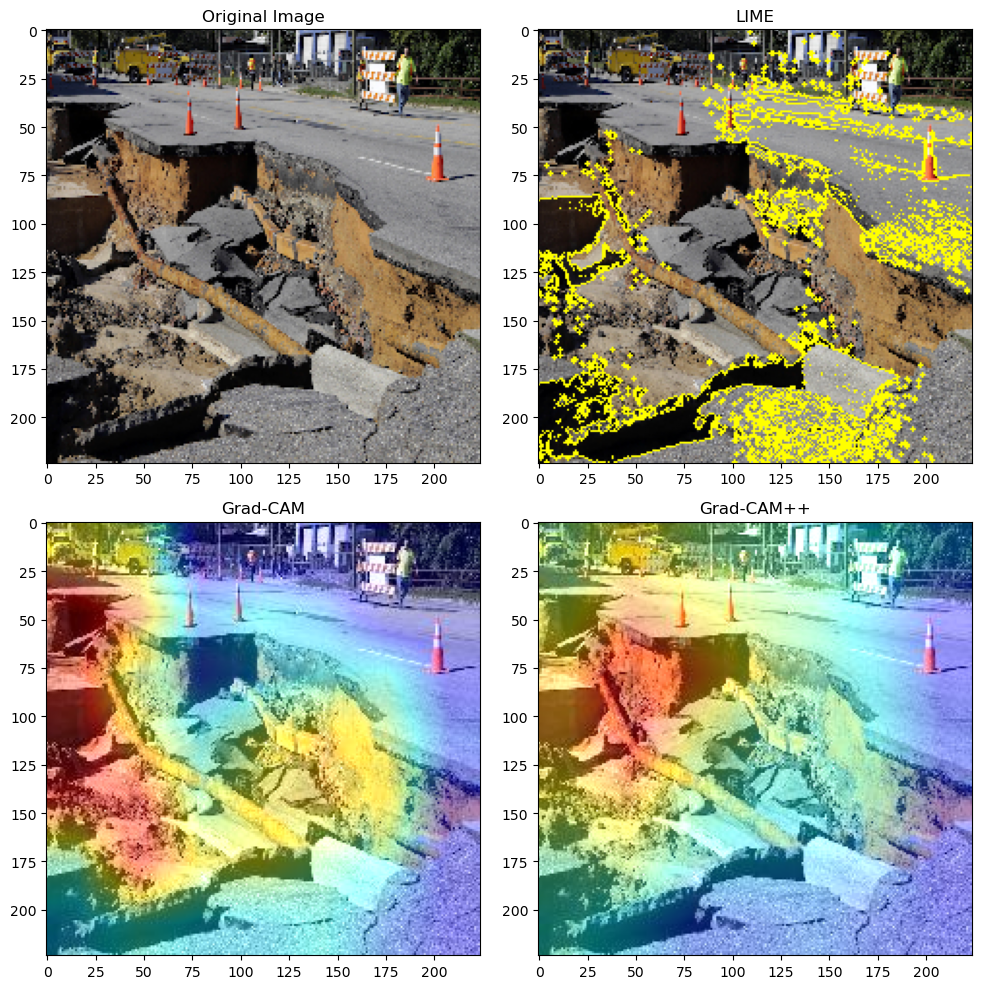

1/1 [==============================] - 0s 292ms/step

✓ Model Output ==> infrastructure



In [23]:
img = url_to_image('https://www.enr.com/ext/resources/News/2016/September/north_carolina_hurricane_matthew.jpg')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

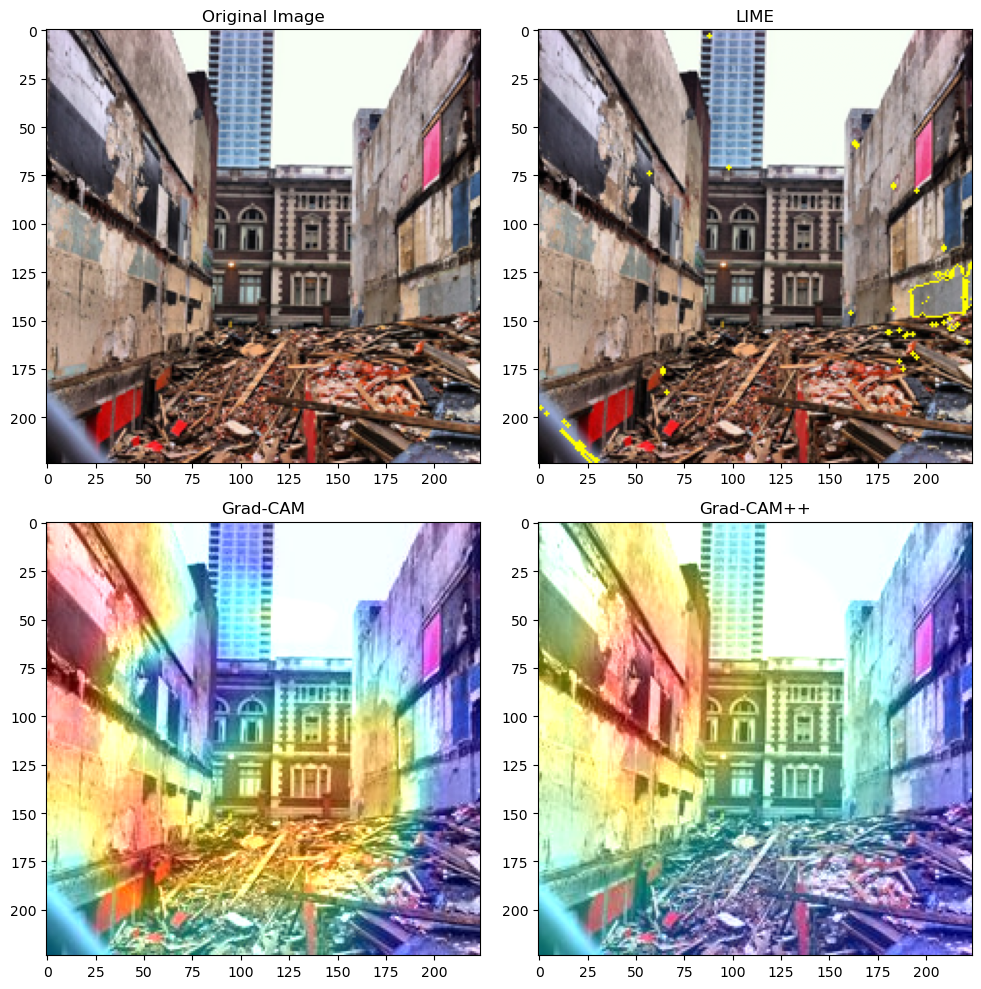

1/1 [==============================] - 0s 30ms/step

✓ Model Output ==> infrastructure



In [24]:
img = path_to_image('05_01_1225.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

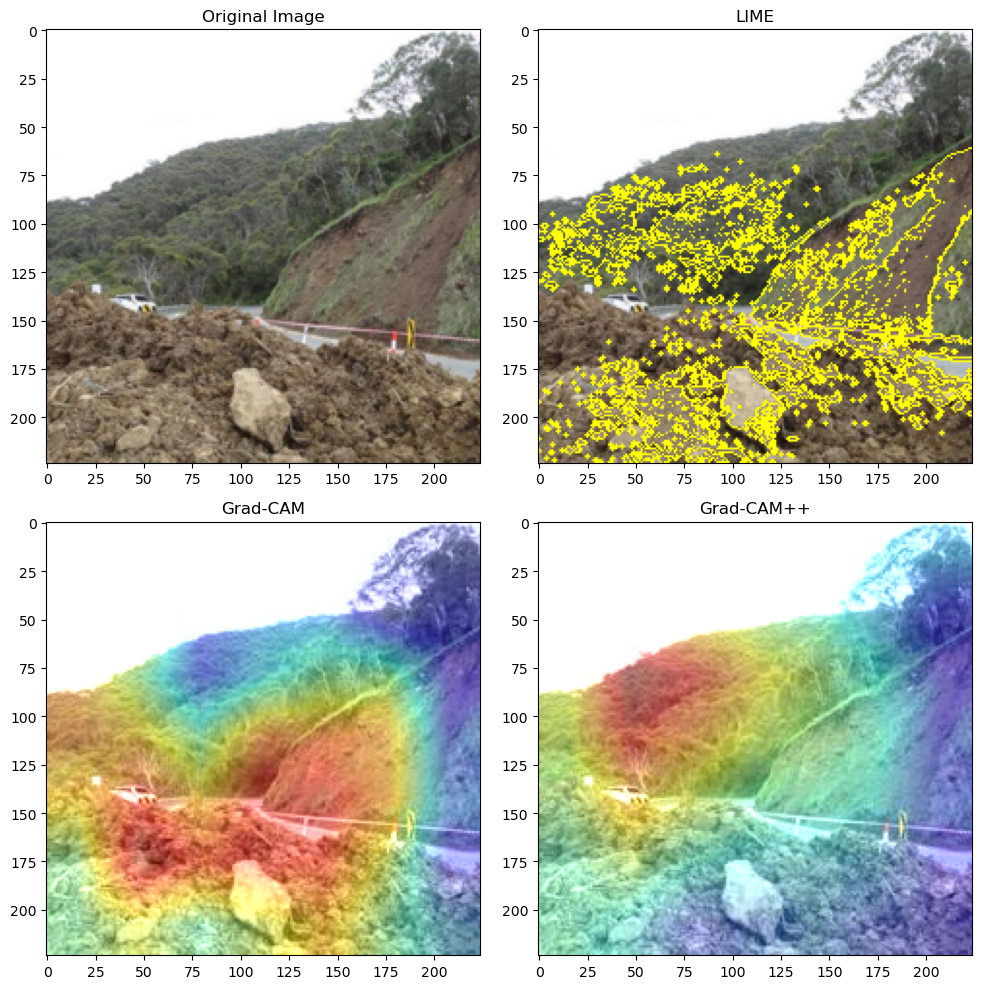

1/1 [==============================] - 0s 29ms/step

✓ Model Output ==> land_slide



In [25]:
img = path_to_image('04_01_0005.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

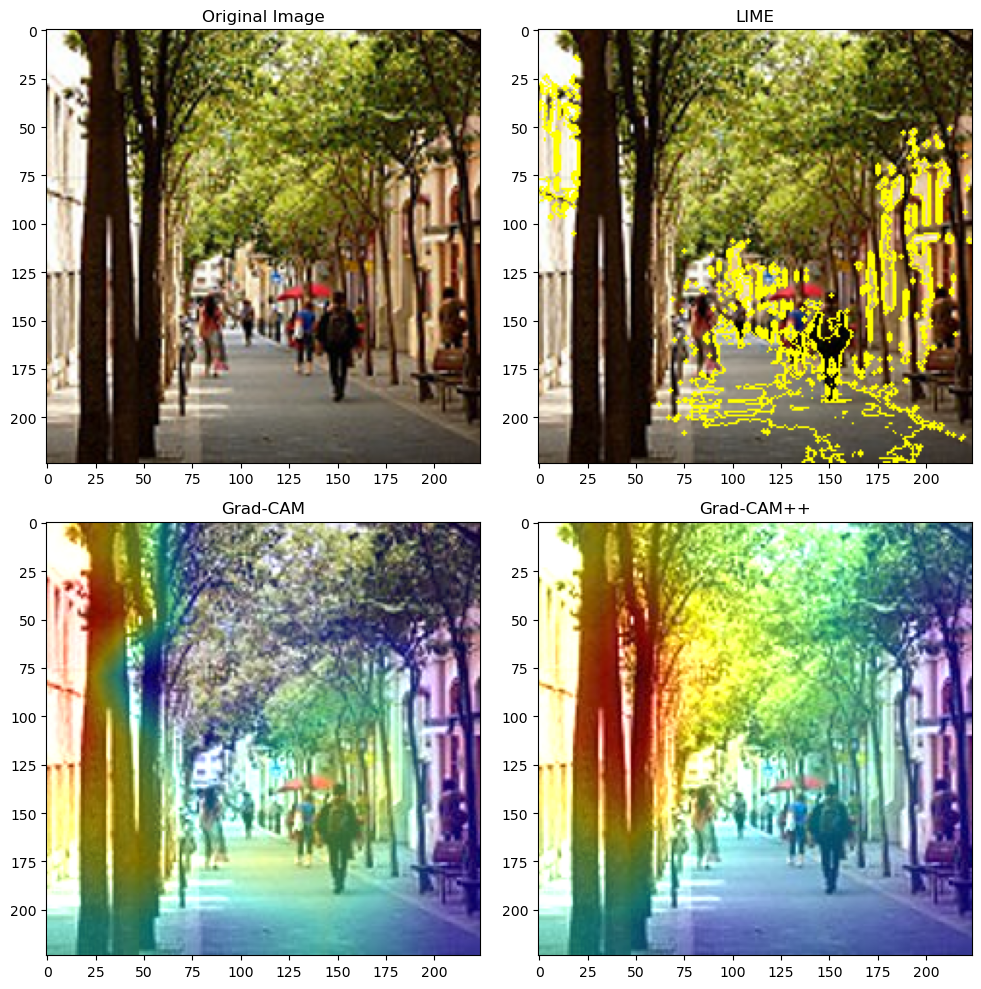

1/1 [==============================] - 0s 27ms/step

✓ Model Output ==> non_damage_buildings_street



In [26]:
img = path_to_image('06_02_2615.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

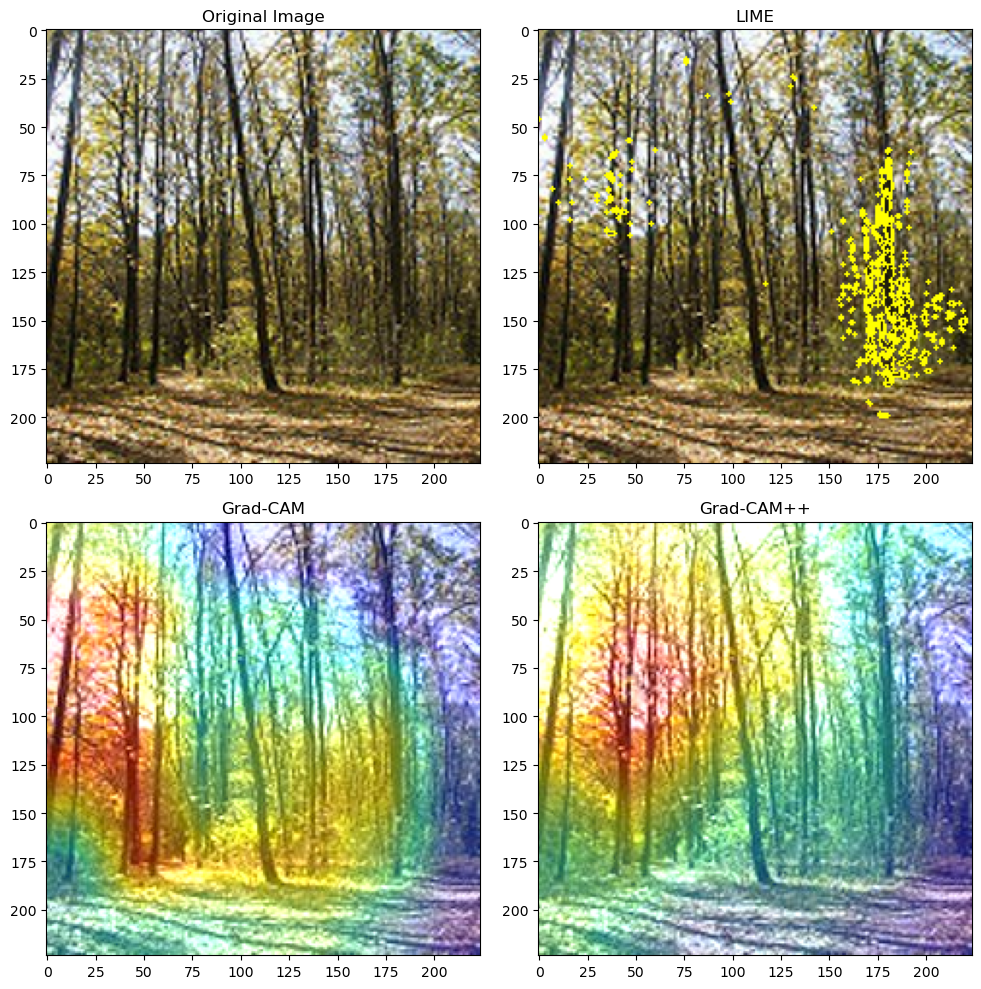

1/1 [==============================] - 0s 28ms/step

✓ Model Output ==> non_damage_wildlife_forest



In [27]:
img = path_to_image('06_03_1742.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

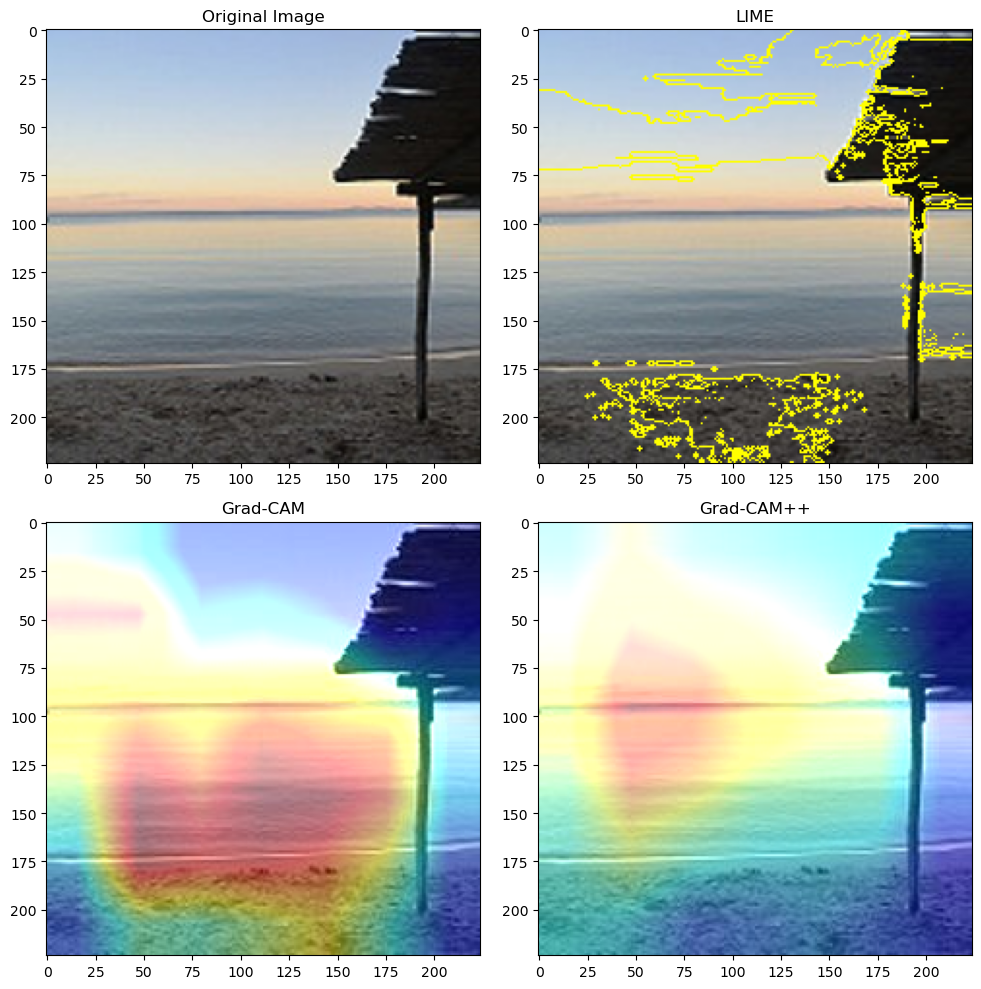

1/1 [==============================] - 0s 30ms/step

✓ Model Output ==> non_damage_sea



In [28]:
img = path_to_image('06_04_0780.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

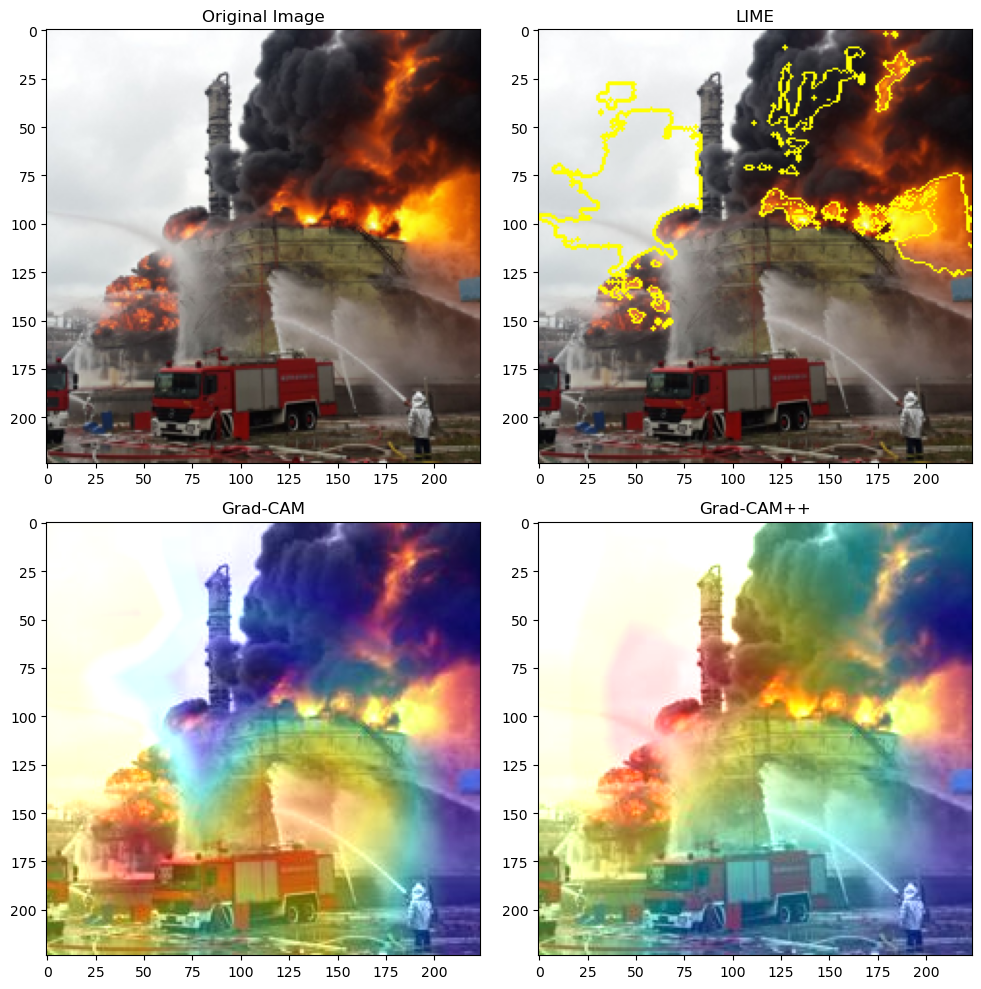

1/1 [==============================] - 0s 29ms/step

✓ Model Output ==> urban_fire



In [29]:
img = path_to_image('01_01_0363.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

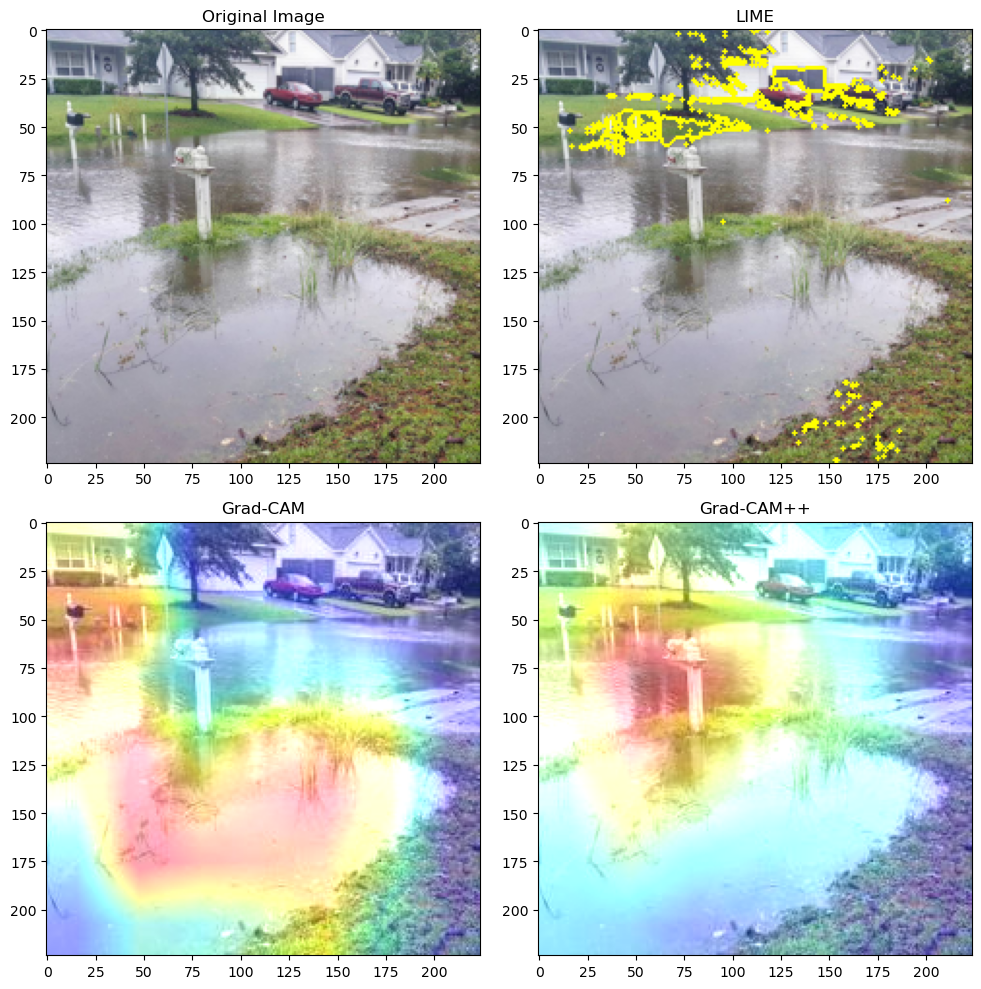

1/1 [==============================] - 0s 30ms/step

✓ Model Output ==> water_disaster



In [30]:
img = path_to_image('03_0005.png')
plot_XAI(img, model)
predict_image_class(img, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

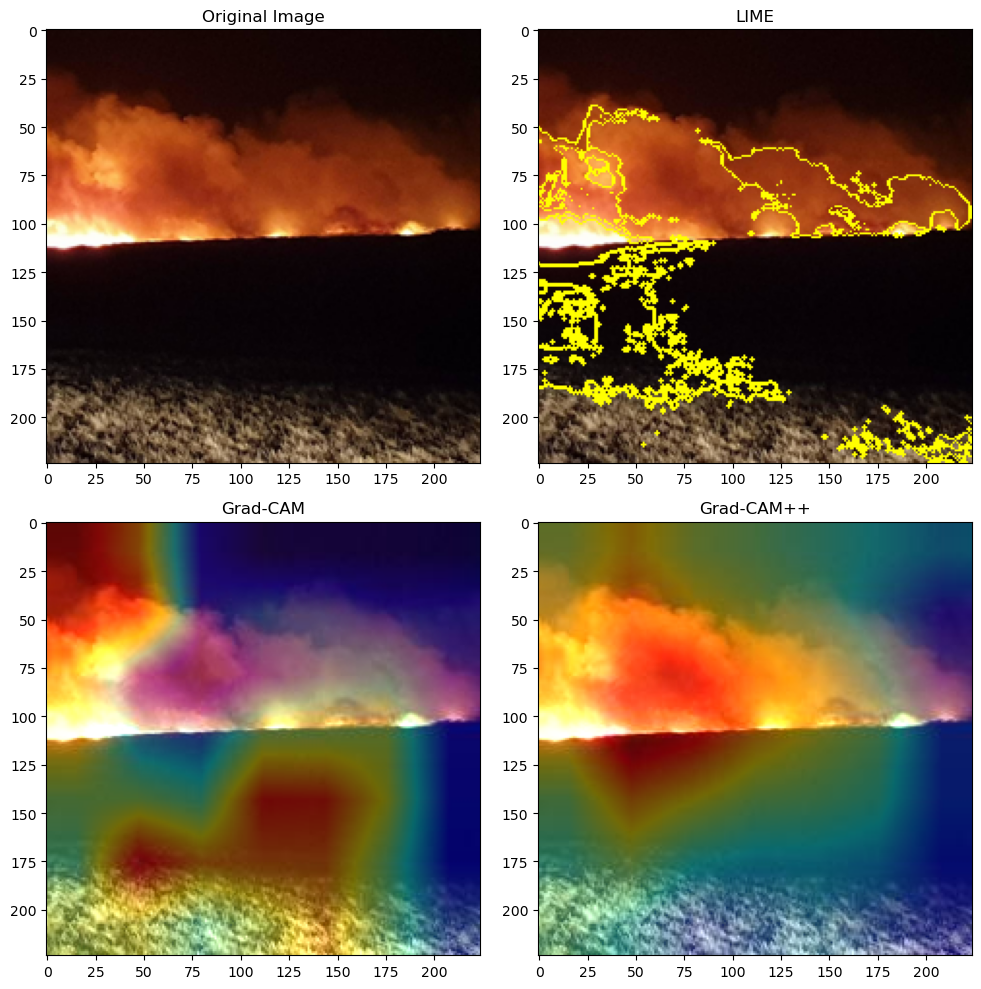

1/1 [==============================] - 0s 30ms/step

✓ Model Output ==> wild_fire



In [31]:
img = path_to_image('01_02_0471.png')
plot_XAI(img, model)
predict_image_class(img, model)